In [3]:
import sys
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
import sys
import h5py
from sklearn import metrics
import seaborn as sns
import ncempy.io.dm as dm
import ncempy.io.mrc as mrc
sys.path.append('/Users/cgroschner/Documents/HTTEM/segmentation/')
import realDataProcess as rdp
import segmentationAnalysis as sega
from keras.models import Model
from keras.layers import *
from keras.optimizers import Adam
from keras.utils import to_categorical
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from keras.losses import binary_crossentropy
from keras.models import load_model
import pandas as pd
from matplotlib.patches import Rectangle
import scipy.fftpack as ftp
from scipy.signal import medfilt2d
from scipy import signal
import CNNviz as cviz

/Users/cgroschner/anaconda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [1]:
from glob import glob

In [2]:
Pt_files = glob('/Users/cgroschner/Documents/HTTEM/particle_data/20190815_sampleJ3/*.mrc')

In [2]:
Au = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/Au/Bal_MedFilt_cutimages_20190726.h5')['images'][:,:,:,:]
CdSe = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/relabel_CdSedots/Bal_MedFilt_CdSeRelabel512Images_20190726.h5')['images'][:,:,:,:]
FePt = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/FePt/08_FePt_FocalSeries_20190726.h5')['images'][:,:,:,:]

In [3]:
FePt = rdp.median_filter_stack(FePt)

In [4]:
i = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/FePt/08_FePt_MedFilt_FocalSeries_20190726.h5','w')
i.create_dataset('images',data=FePt)
i.close()

In [5]:
AuMaps = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/Au/Bal_unFilt_cutimages_20190423_maps.h5')['maps'][:,:,:,:]
CdSeMaps = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/relabel_CdSedots/Bal_unFilt_CdSeRelabel512Images_20190724_maps.h5')['maps'][:,:,:,:]
FePtMaps = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/FePt/08_FePt_FocalSeries_20190726_maps.h5')['maps'][:,:,:,:]

In [254]:
combined = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/combined_stacks/Bal_MedFilt_AuCdSeDots_20190726_v2.h5')['images'][:,:,:,:]
combinedMaps = h5py.File('/Users/cgroschner/Documents/HTTEM/particle_data/combined_stacks/Bal_MedFilt_AuCdSeDots_20190726_maps_v2.h5')['maps'][:,:,:,:]

In [356]:
def  dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)

    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred) + dice_coef_loss(y_true, y_pred)

def down(filters, input_):
    down_ = Conv2D(filters, (3, 3), padding='same')(input_)
    down_ = BatchNormalization(epsilon=1e-4)(down_)
    down_res = Activation('relu')(down_)
    down_pool = MaxPooling2D((2, 2), strides=(2, 2))(down_)
    return down_pool, down_res

def up(filters, input_, down_):
    up_ = UpSampling2D((2, 2))(input_)
    up_ = concatenate([down_, up_], axis=3)
    up_ = Conv2D(filters, (3, 3), padding='same')(up_)
    up_ = BatchNormalization(epsilon=1e-4)(up_)
    up_ = Activation('relu')(up_)
    up_ = Dropout(0.2)(up_)
    up_ = Conv2D(filters, (3, 3), padding='same')(up_)
    up_ = BatchNormalization(epsilon=1e-4)(up_)
    up_ = Activation('relu')(up_)
    return up_

def get_unet_1024(input_shape, num_classes=1):
    inputs = Input(shape=input_shape)

    #down0b, down0b_res = down(8, inputs)
    down0a, down0a_res = down(4, inputs)
    down0, down0_res = down(8, down0a)
    down1, down1_res = down(16, down0)
    down2, down2_res = down(32, down1)

    center = Conv2D(32, (3, 3), padding='same')(down2)
    center = BatchNormalization(epsilon=1e-4)(center)
    center = Activation('relu')(center)
    center = Conv2D(32, (3, 3), padding='same')(center)
    center = BatchNormalization(epsilon=1e-4)(center)
    center = Activation('relu')(center)

    up2 = up(32, center, down2_res)
    up1 = up(16, up2, down1_res)
    up0 = up(8, up1, down0_res)
    up0a = up(4, up0, down0a_res)
    #up0b = up(8, up0a, down0b_res)

    classify = Conv2D(num_classes, (1, 1), activation='sigmoid', name='final_layer')(up0a)

    model = Model(inputs=inputs, outputs=classify)

    return model

In [357]:
model04b = get_unet_1024((512,512,1),2)

model04b.load_weights('/Users/cgroschner/Documents/HTTEM/segmentation/trained_models/unet32_AuCdSeDots_04b.h5')

In [8]:
model07b = get_unet_1024((512,512,1),2)

model07b.load_weights('/Users/cgroschner/Documents/HTTEM/segmentation/trained_models/unet481632_AuDots_07b.h5')

In [9]:
model08 = get_unet_1024((512,512,1),2)

model08.load_weights('/Users/cgroschner/Documents/HTTEM/segmentation/trained_models/unet481632_CdSeDots_08.h5')

In [10]:
predCdSe08 = model08.predict(CdSe[129:])

In [50]:
predAu07b =  model07b.predict(Au[129:])
predCdSe07b = model07b.predict(CdSe[:100])

In [12]:
thresh07b = 0.63
thresh08 = 0.76

In [255]:
predCombo = model04b.predict(combined[129:129+87])

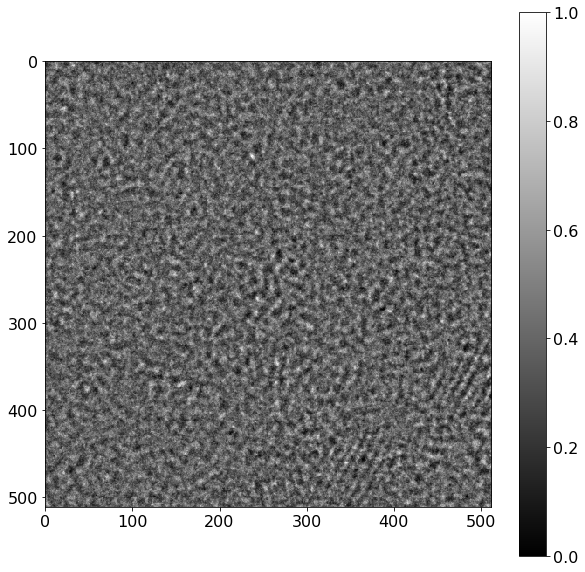

In [256]:
rdp.imm(combined[129])

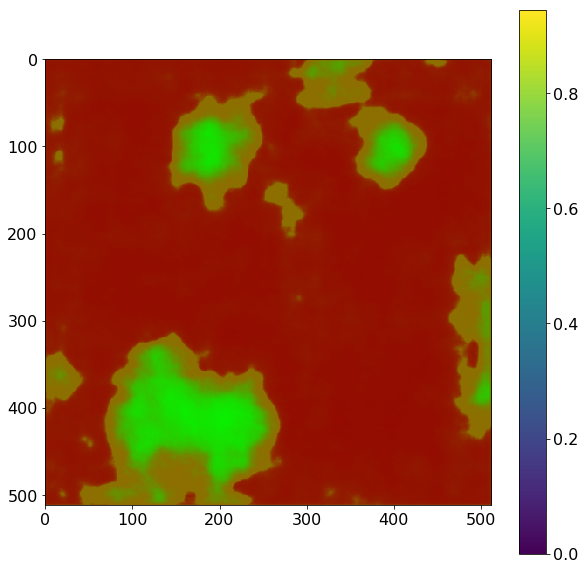

In [258]:
rdp.immMulticlass(predCombo[1])

In [259]:
binCombo = sega.binarize_map(predCombo[:,:,:,1],thresh04b)

In [ ]:
rdp.immOverlay

In [13]:
binCdSe08 = sega.binarize_map(predCdSe08[:,:,:,1],thresh08)
binAu07b = sega.binarize_map(predAu07b[:,:,:,1],thresh07b)
binCdSe07b = sega.binarize_map(predCdSe07b[:,:,:,1],thresh07b)

In [51]:
binCdSe07b = sega.binarize_map(predCdSe07b[:,:,:,1],thresh07b)

In [150]:
i = h5py.File('/Users/cgroschner/Documents/HTTEM/segmentation/predicted_maps/binCdSe07b.h5')
i.create_dataset('images', data = binCdSe07b)
i.close()

In [151]:
i = h5py.File('/Users/cgroschner/Documents/HTTEM/segmentation/predicted_maps/binAu07b.h5')
i.create_dataset('images', data = binAu07b)
i.close()

In [152]:
i = h5py.File('/Users/cgroschner/Documents/HTTEM/segmentation/predicted_maps/binCdSe08.h5')
i.create_dataset('images', data = binCdSe08)
i.close()

In [41]:
def plot_confusion_matrix(cfm, Y_labels,colormap, annotate = True, save=False):
    """Creates a confusion matrix for the different classes given a true labels,predictions, the dataset
    and the desired trained classfier"""
#     cfm = metrics.confusion_matrix(Y, Y_pred)
    cfm = cfm.astype('float') / cfm.sum(axis=1)[:, np.newaxis]


    plt.subplots(figsize=(5,5))
    plt.rcParams['font.size'] = 16
    if annotate == True:
        df_cfm = pd.DataFrame(data = cfm, columns=Y_labels, index=Y_labels)
        ax = sns.heatmap(df_cfm, annot=True,cmap='jet',vmin=0,vmax=1,annot_kws={"size": 16},fmt=".2f")
        ax.collections[0].colorbar.set_yticklabels = []
        ax.set_ylabel('True label', fontsize = 16)
        ax.set_xlabel('Predicted label',fontsize = 16)
        plt.yticks(np.arange(2)+0.5,Y_labels, rotation=90, fontsize="14", va="center")
        plt.xticks(np.arange(2)+0.5,Y_labels,fontsize="14", va="center")
        plt.xticks(fontsize=14)
    else:
        ax = sns.heatmap(cfm, annot=False,cmap=colormap,vmin=0,vmax=1,xticklabels = False, yticklabels = False)
#     
    
    if save == True:
        fname = input('Specify filename to save figure to: ')
        fig = ax.get_figure()
        fig.savefig(fname)

In [247]:
AuMaps[129:].shape

(87, 512, 512, 2)

In [260]:
cfmCombo = metrics.confusion_matrix(combinedMaps[129:129+87,:,:,1].flatten(),binCombo.flatten())

In [15]:
cfmAu07b = metrics.confusion_matrix(AuMaps[129:,:,:,1].flatten(),binAu07b.flatten())
cfmCdSe07b = metrics.confusion_matrix(CdSeMaps[129:,:,:,1].flatten(),binCdSe07b.flatten())
cfmCdSe08 = metrics.confusion_matrix(CdSeMaps[129:,:,:,1].flatten(),binCdSe08.flatten())

In [54]:
cfmCdSe07b = metrics.confusion_matrix(CdSeMaps[:100,:,:,1].flatten(),binCdSe07b.flatten())

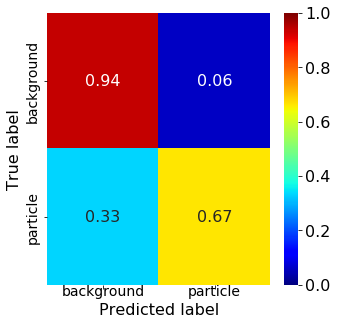

In [261]:
plot_confusion_matrix(cfmCombo,['background','particle'],'jet',True)

Specify filename to save figure to: combinedCFM.png


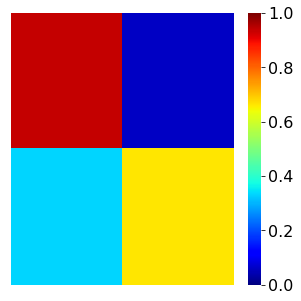

In [262]:
plot_confusion_matrix(cfmCombo,['background','particle'],'jet',False,True)

Specify filename to save figure to: cfmAu07b_nolabels.png


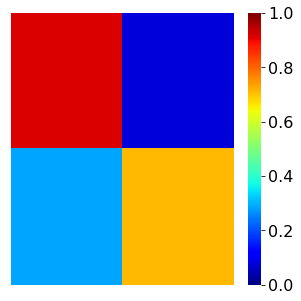

In [37]:
plot_confusion_matrix(cfmAu07b,['background','particle'],'jet',True)

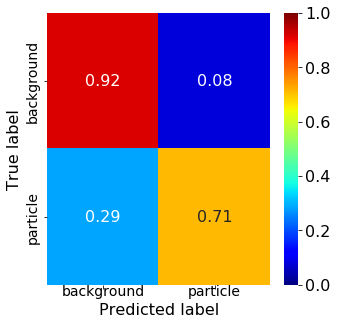

In [48]:
plot_confusion_matrix(cfmAu07b,['background','particle'],'jet',True)

Specify filename to save figure to: cfmCdSe07b_nolabels.png


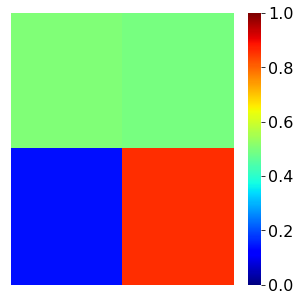

In [38]:
plot_confusion_matrix(cfmCdSe07b,['background','particle'],'jet',True)

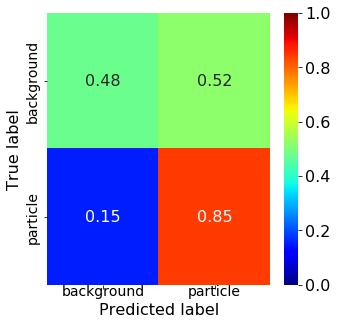

In [55]:
plot_confusion_matrix(cfmCdSe07b,['background','particle'],'jet',True)

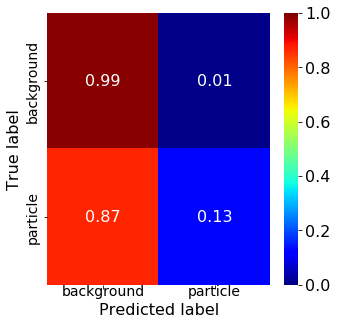

In [49]:
plot_confusion_matrix(cfmCdSe08,['background','particle'],'jet',True)

Specify filename to save figure to: cfmCdSe08_nolabels.png


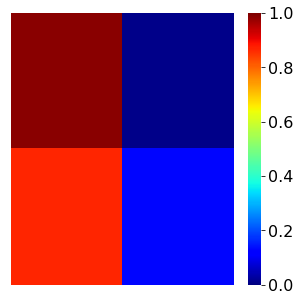

In [149]:
plot_confusion_matrix(cfmCdSe08,['background','particle'],'jet',False,True)

In [63]:
def immOverlay(imgStack,labelStack,idx,colormap):
    img = imgStack[idx]
    label = labelStack[idx]
    size = (img.shape[0],img.shape[1])
    plt.figure(figsize=(10,10))
    if len(label.shape) == 3:
        if label.shape[-1] == 3:
            sizeI = (size[0],size[1],label.shape[-1])
            finalVersion = label.reshape(sizeI)
        elif label.shape[-1] == 2:
            sizeI = (size[0],size[1],label.shape[-1])
            rgbVersion = np.zeros((sizeI[0],sizeI[1],1))
            finalVersion = label.reshape(sizeI)
            finalVersion = np.concatenate((finalVersion,rgbVersion),axis = 2)
        elif label.shape[-1] == 1:
            sizeI = (size[0],size[1],label.shape[-1])
            finalVersion = label.reshape(sizeI)
        else:
            raise(RuntimeError('Unexpected shape of input image tensor'))
    elif len(label.shape) == 2:
        sizeI = size
        finalVersion = label.reshape(sizeI)
    else:
        raise(RuntimeError('Unexpected shape of input image tensor'))
    plt.imshow(img.reshape(size),cmap = 'gray')
    plt.imshow(finalVersion,alpha = 0.4,cmap=colormap)

In [106]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

top = cm.get_cmap('jet', 128)
bottom = cm.get_cmap('gnuplot', 128)

newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                       bottom(np.linspace(0, 1, 128))))
newcmp = ListedColormap(newcolors, name='BerkeleyMax')

In [126]:
jetBig = cm.get_cmap('jet', 512)
newcmp = ListedColormap(jetBig(np.linspace(0.01, 0.67, 256)))

In [237]:
def add_scalebar(ax,size,scale,unit,loc,offx = 10,fontSize=20):
    """Add scale bar to already existing image plotted with plt.imshow"""
    if unit[0] == 'nm':
        pixels = size//scale[0]
    elif unit[0] == 'µm':
        newscale = scale[0]*1000
        pixels = size//newscale
    else:
        raise('RuntimeError')
    x = loc[0]
    y = loc[1]
    rect = Rectangle((x,y),pixels,10,linewidth=1,edgecolor='w',facecolor='w')
#     ax.text(x+offx,y-5 ,str(size)+unit[0],color = 'w',fontsize=fontSize)
    ax.add_patch(rect)

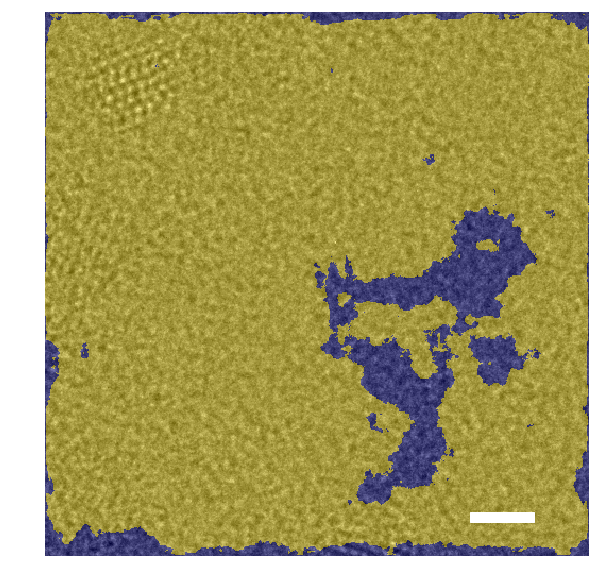

In [239]:
immOverlay(CdSe[129:],binCdSe07b,15,newcmp)
plt.axis('off')
ax = plt.gca()
add_scalebar(ax,2,[0.033],['nm','nm'],(400,470),offx=10)
plt.savefig('CdSeDots07_newCmap_v2.png')

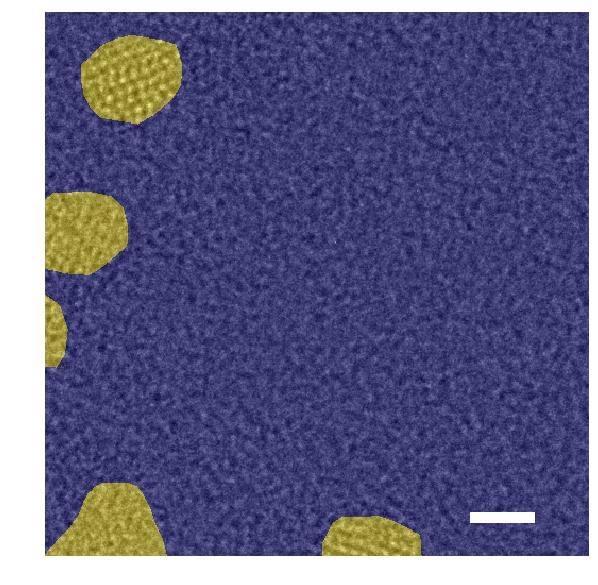

In [240]:
immOverlay(CdSe[129:],CdSeMaps[129:,:,:,1],15,newcmp)
plt.axis('off')
ax = plt.gca()
add_scalebar(ax,2,[0.033],['nm','nm'],(400,470),offx=10)
plt.savefig('CdSeDots07_original_v3_v2.png')

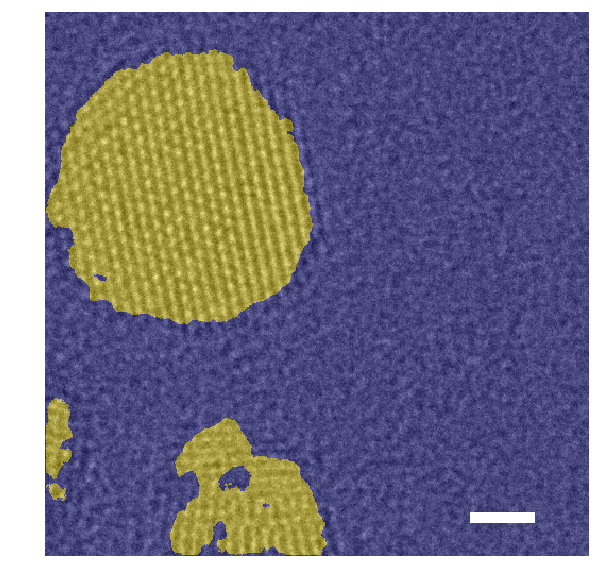

In [241]:
immOverlay(Au[129:],binAu07b,12,newcmp)
plt.axis('off')
ax = plt.gca()
add_scalebar(ax,2,[0.033],['nm','nm'],(400,470),offx=10)
plt.savefig('AuDots07_newCmap_v2.png')

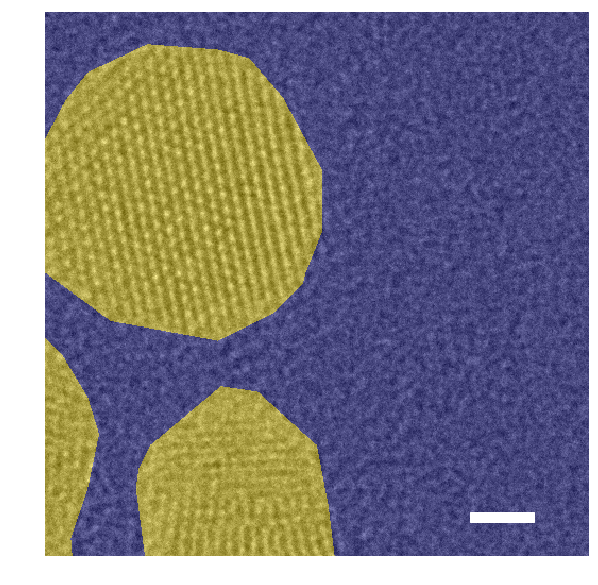

In [242]:
immOverlay(Au[129:],AuMaps[129:,:,:,1],12,newcmp)
plt.axis('off')
ax = plt.gca()
add_scalebar(ax,2,[0.033],['nm','nm'],(400,470),offx=10)
plt.savefig('AuDots07_original_v3_v2.png')

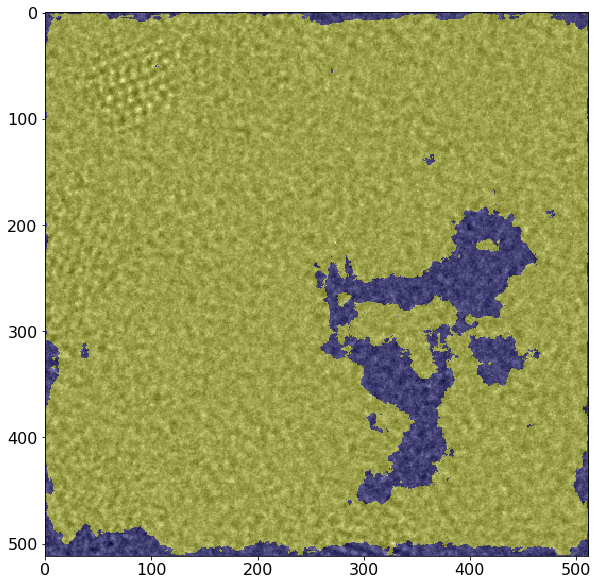

In [97]:
immOverlay(CdSe[129:],binCdSe07b,15,'plasma')

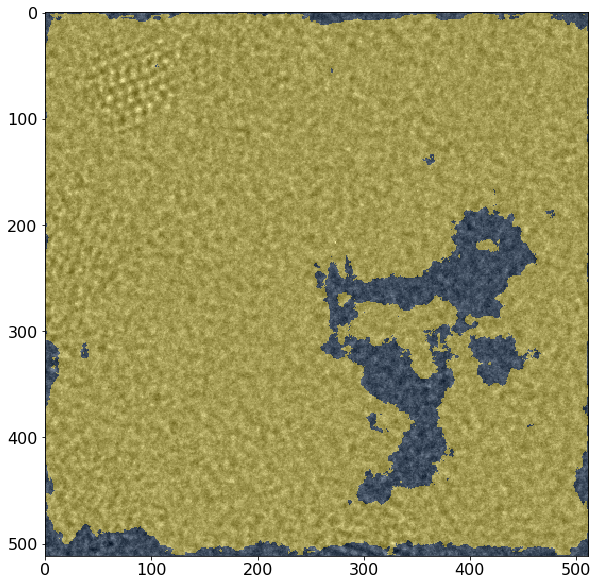

In [108]:
immOverlay(CdSe[129:],binCdSe07b,15,'cividis')

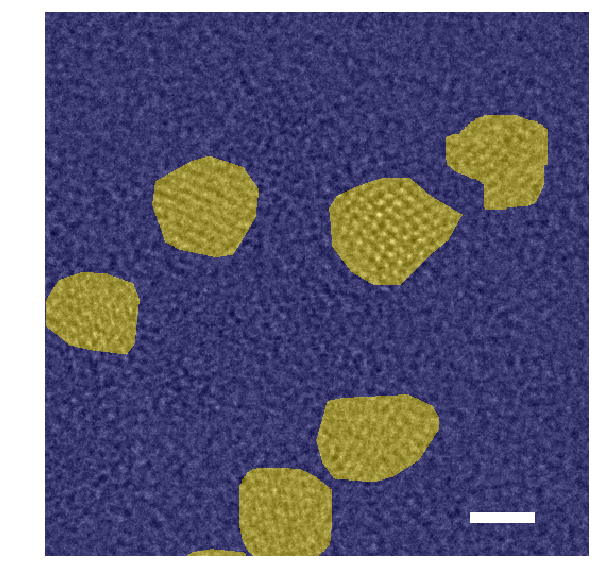

In [243]:
immOverlay(CdSe[129:],CdSeMaps[129:,:,:,1],3,newcmp)
plt.axis('off')
ax = plt.gca()
add_scalebar(ax,2,[0.033],['nm','nm'],(400,470),offx=10)
plt.savefig('CdSeDots08_original_v3_v2.png')

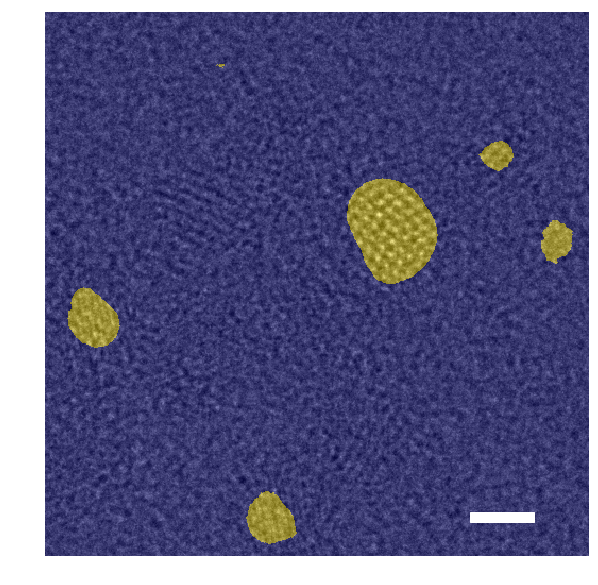

In [244]:
immOverlay(CdSe[129:],binCdSe08,3,newcmp)
plt.axis('off')
ax = plt.gca()
add_scalebar(ax,2,[0.033],['nm','nm'],(400,470),offx=10)
plt.savefig('CdSeDots08_predicted_v3_v2.png')

# Combined Dataset

In [364]:
thresh04b = 0.49

In [155]:
predAu04b = model04b.predict(Au[129:])

predCdSe04b = model04b.predict(CdSe[129:])

binAu04b = sega.binarize_map(predAu04b[:,:,:,1],thresh04b)

binCdSe04b = sega.binarize_map(predCdSe04b[:,:,:,1],thresh04b)


NameError: name 'binAu' is not defined

In [156]:

cfmAu04b = metrics.confusion_matrix(AuMaps[129:,:,:,1].flatten(),binAu04b.flatten())

cfmCdSe04b = metrics.confusion_matrix(CdSeMaps[129:,:,:,1].flatten(),binCdSe04b.flatten())

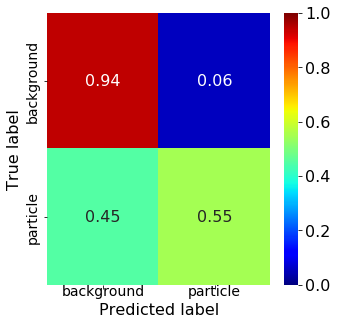

In [157]:
plot_confusion_matrix(cfmCdSe04b,['background','particle'],'jet',True)

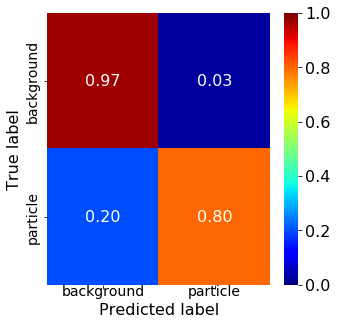

In [158]:
plot_confusion_matrix(cfmAu04b,['background','particle'],'jet',True)

Specify filename to save figure to: cfmAu04b_nolabels.png


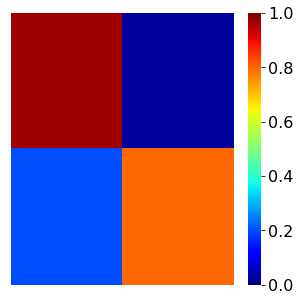

In [159]:
plot_confusion_matrix(cfmAu04b,['background','particle'],'jet',False,True)

Specify filename to save figure to: cfmCdSe04b_nolabels.png


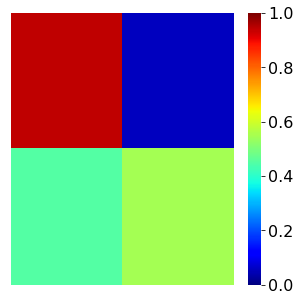

In [160]:
plot_confusion_matrix(cfmCdSe04b,['background','particle'],'jet',False,True)

In [381]:
def bragg_filter(img,ksize = 9, sig = 1,shape = (512,512),cut_edge = (50,50), plot = False):
    fft = ftp.fftshift(ftp.fft2(img.reshape(img.shape[0],img.shape[1])))
    intf = np.log(abs(fft)**2)
    intfilt= medfilt2d(intf,kernel_size=25)
#     intf = signal.convolve2d(intf,kernel)
#     cut_pix_x = (intf.shape[0]- shape[0])//2
#     cut_pix_y = (intf.shape[1]- shape[1])//2
#     intf = intf[cut_pix_x:-cut_pix_x,cut_pix_y:-cut_pix_y]
    if plot == True:
        plt.figure()
        rdp.imm(img)
        plt.figure()
        rdp.imm(intf)
        plt.figure()
        rdp.imm(intfilt)
    dif = intf-intfilt
#     dif = closing(dif)
#     dif = opening(dif)
    dif[dif < 2*intfilt.std()] = 0
    if plot == True:
        plt.figure()
        rdp.imm(dif)
    kernel = gkern(ksize,sig)
    if plot == True:
        plt.figure()
        plt.imshow(kernel)
    peaks = signal.convolve2d(dif,kernel)
    cut_pix_x = (peaks.shape[0]- shape[0])//2
    cut_pix_y = (peaks.shape[1]- shape[1])//2
    peaks = peaks[cut_pix_x:-cut_pix_x,cut_pix_y:-cut_pix_y]
    if plot == True:
        plt.figure()
        rdp.imm(dif)
    peaks[:cut_edge[0],:]= 0
    peaks[-cut_edge[0]:,:] =0
    peaks[:,:cut_edge[1]]= 0
    peaks[:,-cut_edge[1]:] =0
    peaks[peaks>0] = 1
    smoother_peaks = signal.convolve2d(peaks,kernel)
    smoother_peaks = smoother_peaks[cut_pix_x:-cut_pix_x,cut_pix_y:-cut_pix_y]
    inv_peaks = smoother_peaks.copy()
    inv_peaks += 1
    inv_peaks[inv_peaks> 1] = 0
    inv_peaks = signal.convolve2d(inv_peaks,kernel)
    inv_peaks = inv_peaks[cut_pix_x:-cut_pix_x,cut_pix_y:-cut_pix_y]
    filtered_fft = fft*smoother_peaks
    inv_filtered_fft = fft*inv_peaks
    return filtered_fft, inv_filtered_fft

In [382]:
def gkern(kernlen=21, std=3):
    """Returns a 2D Gaussian kernel array."""
    gkern1d = signal.gaussian(kernlen, std=std).reshape(kernlen, 1)
    gkern2d = np.outer(gkern1d, gkern1d)
    return gkern2d

In [161]:
predFePt04b = model04b.predict(FePt)
binFePt04b = sega.binarize_map(predFePt04b[:,:,:,1],thresh04b)

In [162]:
FePt_bragg = np.load('/Users/cgroschner/Documents/HTTEM/segmentation/data_postprocessing/FePt_bragg.npy')

Au_bragg = np.load('/Users/cgroschner/Documents/HTTEM/segmentation/data_postprocessing/Au_bragg_v2.npy')

CdSe_bragg = np.load('/Users/cgroschner/Documents/HTTEM/segmentation/data_postprocessing/CdSe_bragg_v2.npy')

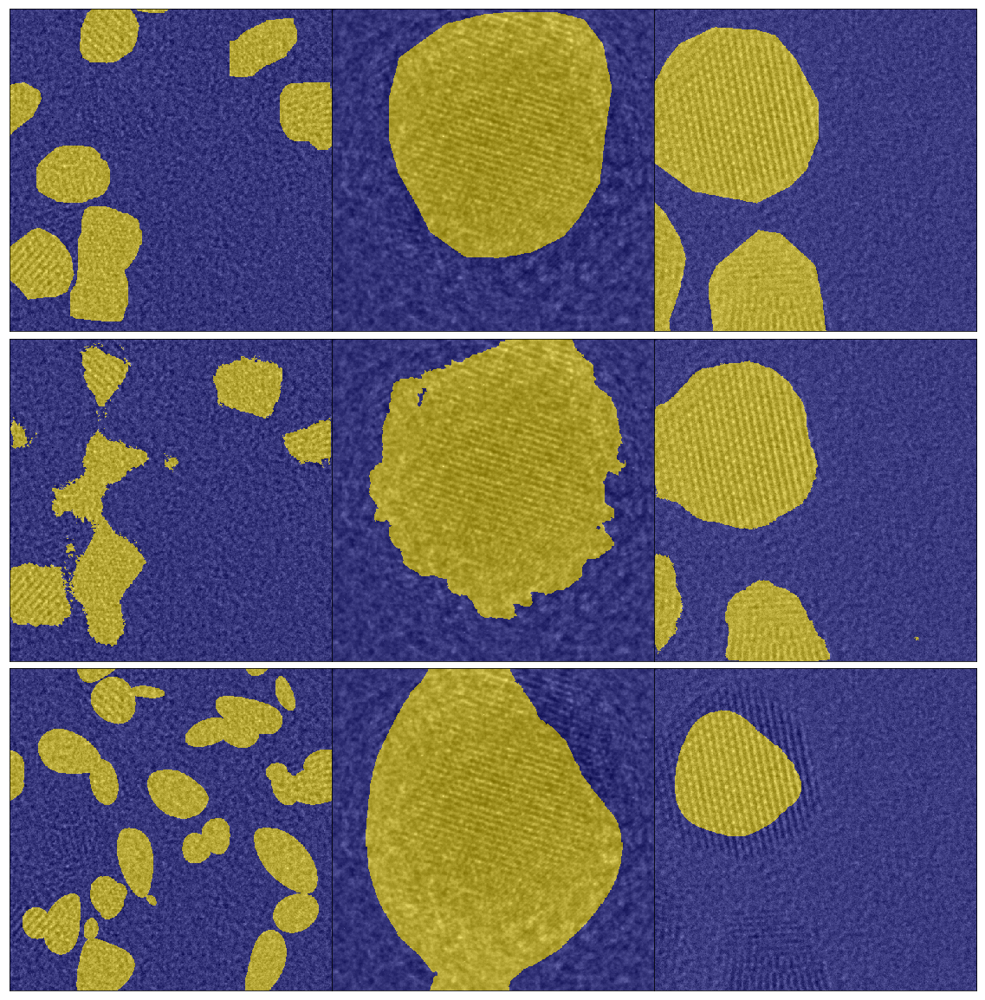

In [166]:
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(20, 21),
                        subplot_kw={'xticks': [], 'yticks': []},sharex=True,sharey=True)
fig.subplots_adjust(hspace=0.00001, wspace=0.0)
axs[0,0].imshow(CdSe[134].reshape((512,512)),cmap='gray')
axs[0,0].imshow(CdSeMaps[134,:,:,1].reshape((512,512)),alpha=0.5,cmap=newcmp)
axs[0,1].imshow(FePt[0].reshape((512,512)),cmap='gray')
axs[0,1].imshow(FePtMaps[0,:,:,1].reshape((512,512)),alpha=0.5,cmap=newcmp)
axs[0,2].imshow(Au[141].reshape((512,512)),cmap='gray')
axs[0,2].imshow(AuMaps[141,:,:,1].reshape((512,512)),alpha=0.5,cmap=newcmp)
axs[1,0].imshow(CdSe[134].reshape((512,512)),cmap='gray')
axs[1,0].imshow(binCdSe04b[5].reshape((512,512)),alpha=0.5,cmap=newcmp)
axs[1,1].imshow(FePt[0].reshape((512,512)),cmap='gray')
axs[1,1].imshow(binFePt04b[0].reshape((512,512)),alpha=0.5,cmap=newcmp)
axs[1,2].imshow(Au[141].reshape((512,512)),cmap='gray')
axs[1,2].imshow(binAu04b[12].reshape((512,512)),alpha = 0.5,cmap=newcmp)
axs[2,0].imshow(CdSe[134].reshape((512,512)),cmap='gray')
axs[2,0].imshow(CdSe_bragg[0].reshape((512,512)),alpha=0.5,cmap=newcmp)
axs[2,1].imshow(FePt[0].reshape((512,512)),cmap='gray')
axs[2,1].imshow(FePt_bragg[0].reshape((512,512)),alpha=0.5,cmap=newcmp)
axs[2,2].imshow(Au[141].reshape((512,512)),cmap='gray')
axs[2,2].imshow(Au_bragg[0].reshape((512,512)),alpha = 0.5,cmap=newcmp)

# axs[0,0].set_title('SBR = 1.16',fontsize = 14,fontweight = 'semibold')
# axs[0,1].set_title('SBR = 1.24',fontsize = 13.5,fontweight = 'semibold')
# axs[0,2].set_title('SBR = 1.49',fontsize = 13.5,fontweight = 'semibold')
# rows = ['Original Micrograph','Segmentation Map Overlayed','Segmentation by Fourier Filtering']
# for ax, row in zip(axs[:,0], rows):
#     ax.set_ylabel(row, rotation=90, fontsize = 14,fontweight = 'semibold')
plt.savefig('/Users/cgroschner/Desktop/ML_paper_figures/PaperV2/SNRimg3.png')

# Activation Layers and Kernels

In [167]:
def generate_pattern(model,layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 1)) * 20 + 128
    input_img_data = input_img_data/input_img_data.max()
    step = 1
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    return input_img_data

In [215]:
def calc_kernels(model,layer_name,num_kernels,colormap):
    size = 512
    margin = 5
    if num_kernels%2 != 0:
        raise RuntimeError('num_kernels needs to be even.')
    results = np.zeros((num_kernels//2 * size + 3 * margin, num_kernels//2 * size + 3 * margin))
    for i in range(num_kernels//2):
        for j in range(num_kernels//2):
            filter_img = generate_pattern(model,layer_name, i + (j) , size=size)
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end,vertical_start: vertical_end] = filter_img.reshape(512,512)/filter_img.max()
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(results, cmap = colormap)
    return results

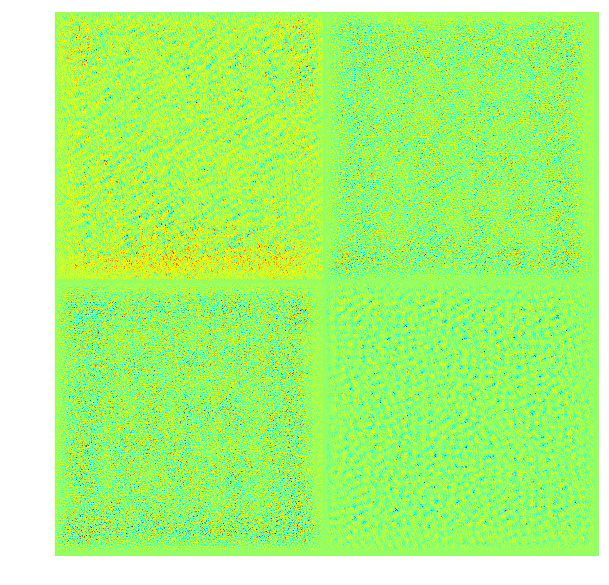

In [173]:
layer_name = 'conv2d_10'
conv2d_10 = calc_kernels(model04b,layer_name,'jet')

In [174]:
def plot_kernel(kernels,colormap):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(kernels, cmap = colormap)

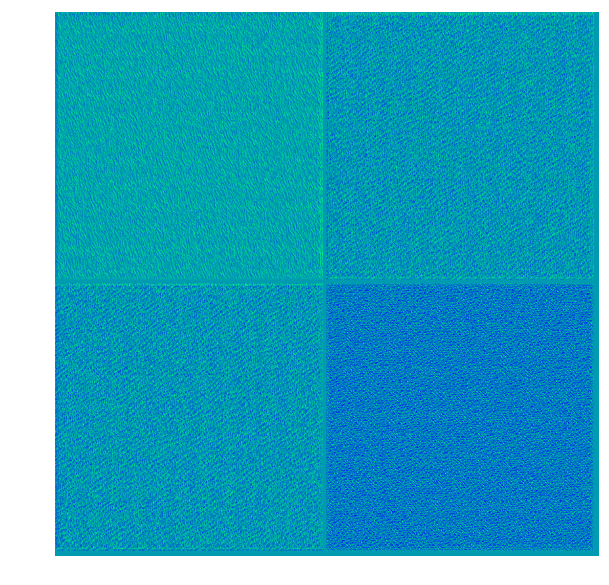

In [206]:
layer_name = 'conv2d_3'
conv2d_3 = calc_kernels(model04b,layer_name,'winter')

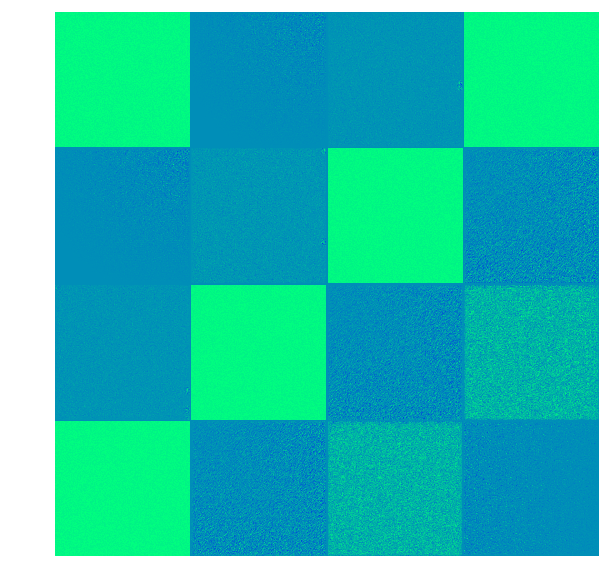

In [216]:
layer_name = 'concatenate_1'
concatenate_1 = calc_kernels(model04b,layer_name,8,'winter')

In [217]:
concatenate_1.shape

(2063, 2063)

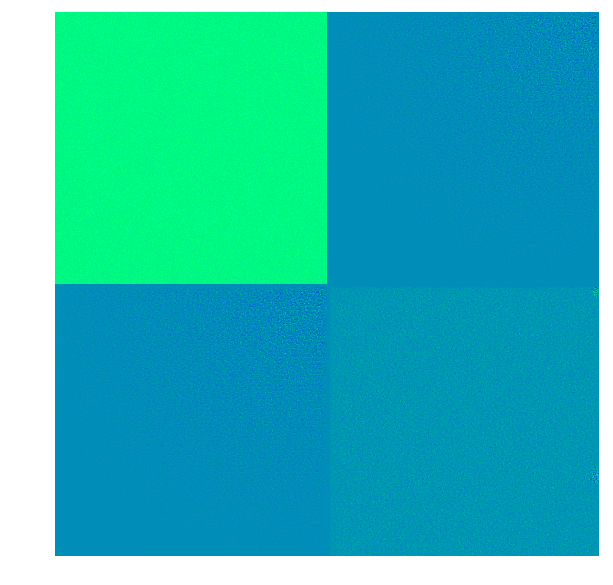

In [221]:
plot_kernel(concatenate_1[:512*2,:512*2],'winter')

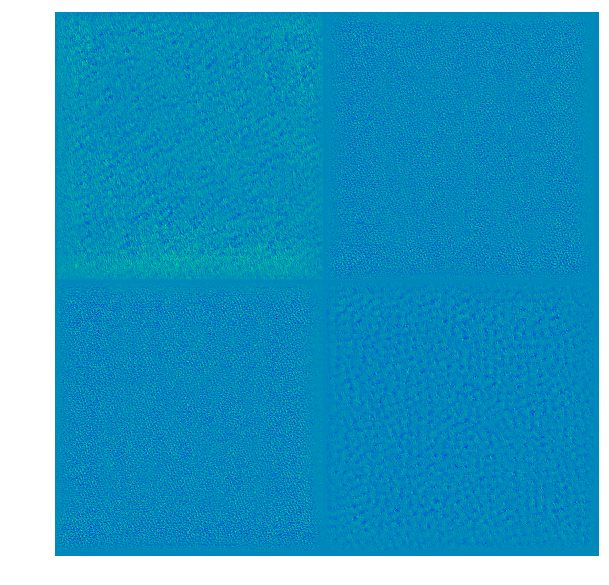

In [177]:
plot_kernel(conv2d_10,'winter')

In [188]:
model04b.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 512, 512, 1)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 512, 4)  40          input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 512, 512, 4)  16          conv2d_1[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, 256, 256, 4)  0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

In [189]:
actAu_layer10 = cviz.feat_activations(model04b,Au[141:142],38)

In [195]:
actAu_layer10[37].shape

(1, 128, 128, 16)

In [224]:
actAu_layer10[21].shape

(1, 64, 64, 64)

In [196]:
def plot_activations(activations,layer_num):
    fig, axs = plt.subplots(nrows=1, ncols=8, figsize=(20, 13),
                            subplot_kw={'xticks': [], 'yticks': []},sharex=True,sharey=True)
    fig.subplots_adjust(hspace=0.0015, wspace=0.001)
    axs[0].imshow(activations[layer_num][:,:,:,0].reshape((activations[layer_num].shape[1],activations[layer_num].shape[2])))
    axs[1].imshow(activations[layer_num][:,:,:,1].reshape((activations[layer_num].shape[1],activations[layer_num].shape[2])))
    axs[2].imshow(activations[layer_num][:,:,:,2].reshape((activations[layer_num].shape[1],activations[layer_num].shape[2])))
    axs[3].imshow(activations[layer_num][:,:,:,3].reshape((activations[layer_num].shape[1],activations[layer_num].shape[2])))
    axs[4].imshow(activations[layer_num][:,:,:,4].reshape((activations[layer_num].shape[1],activations[layer_num].shape[2])))
    axs[5].imshow(activations[layer_num][:,:,:,5].reshape((activations[layer_num].shape[1],activations[layer_num].shape[2])))
    axs[6].imshow(activations[layer_num][:,:,:,6].reshape((activations[layer_num].shape[1],activations[layer_num].shape[2])))
    axs[7].imshow(activations[layer_num][:,:,:,7].reshape((activations[layer_num].shape[1],activations[layer_num].shape[2])))
    # plt.savefig('activations_Au04b_layer10.png')

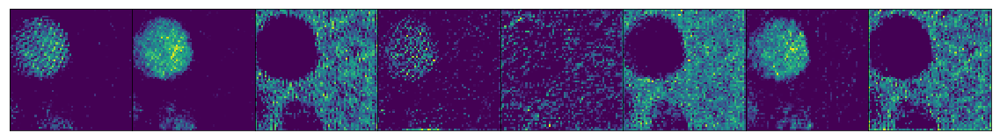

In [229]:
plot_activations(actAu_layer10,21)
plt.savefig('activations_concat1.png')

In [225]:
actAu_layer10[8].shape

(1, 128, 128, 16)

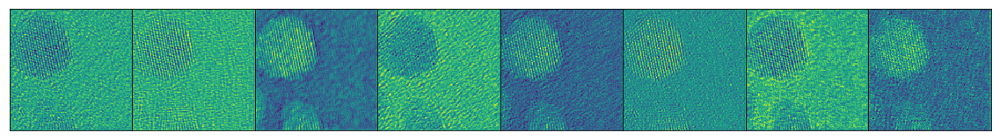

In [228]:
plot_activations(actAu_layer10,7)
plt.savefig('activations_conv3.png')

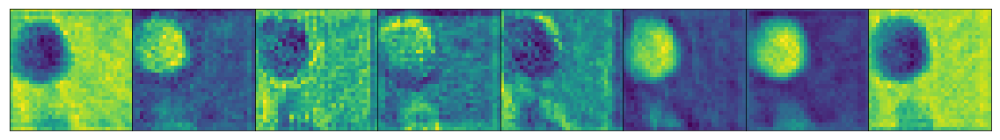

In [232]:
plot_activations(actAu_layer10,16)
plt.savefig('activations_conv8.png')

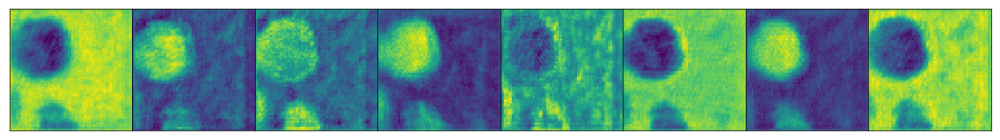

In [231]:
plot_activations(actAu_layer10,26)

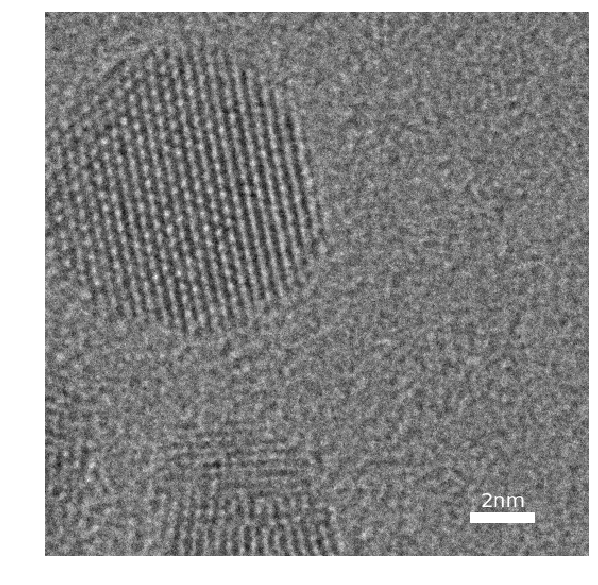

In [236]:
rdp.imm(Au[141:142],colorbar=False)
plt.axis('off')
ax = plt.gca()
add_scalebar(ax,2,[0.033],['nm','nm'],(400,470),offx=10)
plt.savefig('Au.png')

# Pt nanoparticle test

In [159]:
test = mrc.mrcReader(Pt_files[12])

In [160]:
test['data'].shape

(1, 1024, 1024)

In [161]:
test = test['data'][0].reshape((1024,1024))

In [162]:
test.shape

(1024, 1024)

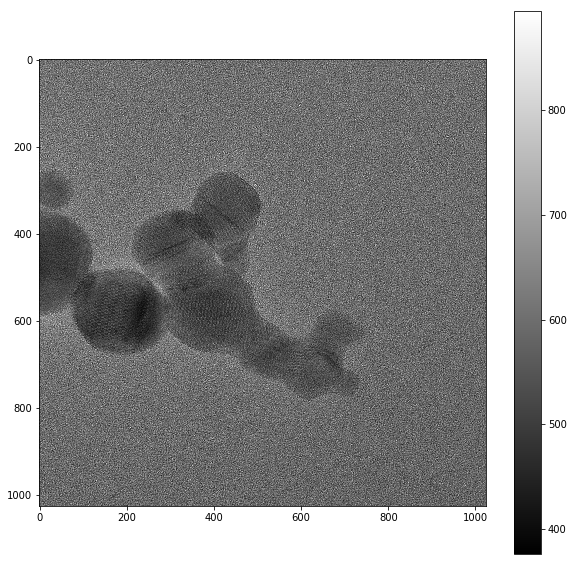

In [163]:
rdp.imm(test,size=test.shape)

In [164]:
Pd_files = glob('/Users/cgroschner/Documents/HTTEM/particle_data/20190717_Box5C2_Pd/*.dm3')

In [379]:
test = dm.dmReader(Pd_files[21])

In [380]:
test

{'filename': '20190717_box5c2_0022.dm3',
 'data': array([[1337, 1253, 1217, ..., 1171, 1187, 1185],
        [1185, 1163, 1217, ..., 1233, 1222, 1265],
        [1139, 1053, 1132, ..., 1174, 1251, 1223],
        ...,
        [1038, 1070, 1082, ..., 1100, 1146, 1179],
        [1069, 1043, 1065, ..., 1189, 1088, 1097],
        [1073, 1123, 1096, ..., 1278, 1217, 1154]], dtype=int32),
 'pixelUnit': ['nm', 'nm'],
 'pixelSize': [0.054000784, 0.054000784],
 'pixelOrigin': [0.0, 0.0]}

In [341]:
test = test['data']
test.shape
# test = rdp.median_filter(test)

(1024, 1024)

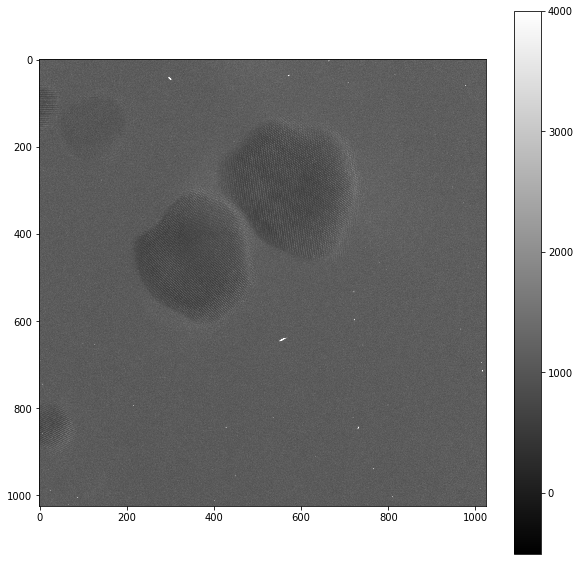

In [344]:
plt.figure(figsize=(10,10))
plt.imshow(test,vmax=4000,cmap='gray')
plt.colorbar()

In [352]:
a = test[200:200+512,:512]

In [350]:
a.shape

(512, 512)

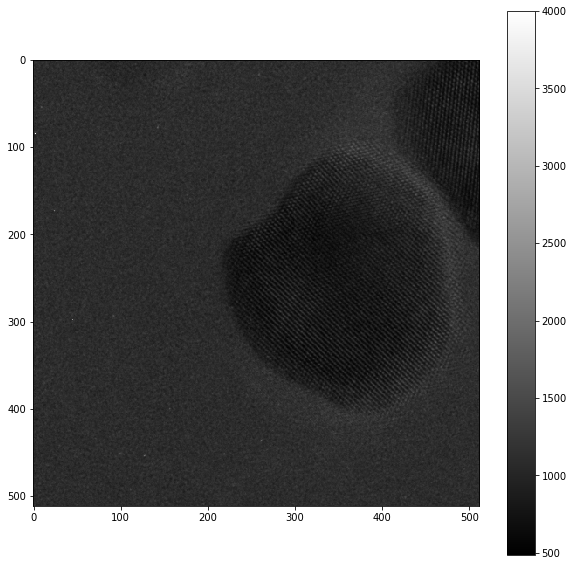

In [353]:
plt.figure(figsize=(10,10))
plt.imshow(a,vmax=4000,cmap='gray')
plt.colorbar()

In [354]:
a = rdp.median_filter(a)

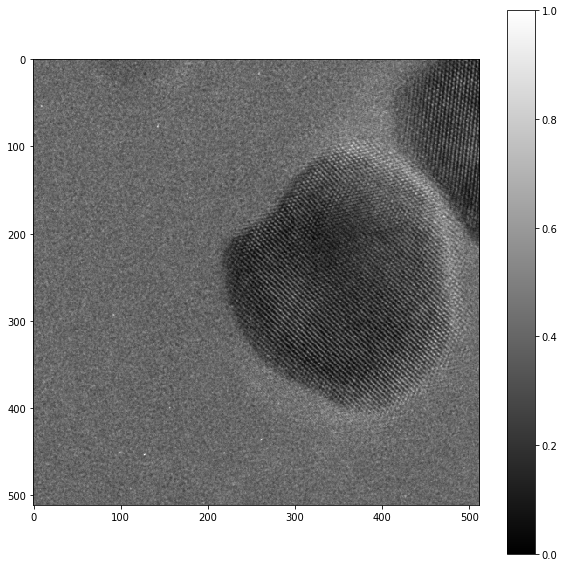

In [355]:
plt.figure(figsize=(10,10))
plt.imshow(a,cmap='gray')
plt.colorbar()

In [359]:
a = np.expand_dims(a,axis = 0)

In [360]:
a = np.expand_dims(a,axis = 3)

In [361]:
a.shape

(1, 512, 512, 1)

In [362]:
a_pred = model04b.predict(a)

In [367]:
a_bin = sega.binarize_map(a_pred[:,:,:,1],thresh04b)

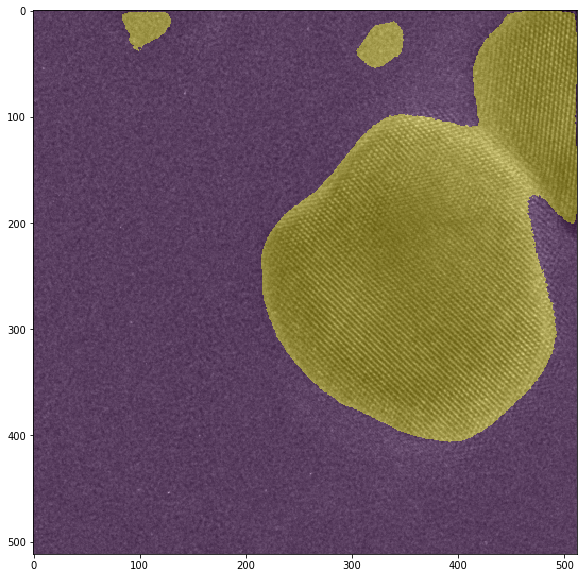

In [368]:
rdp.immOverlay(a,a_bin,0)

In [373]:
Pd = a

In [374]:
Pd_bin = a_bin

In [370]:
from skimage import io

In [372]:
io.imsave('Pd_img.png',a.reshape(512,512))

/Users/cgroschner/anaconda/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


In [375]:
PdMap = io.imread('PixelLabelData/Label_1.png')

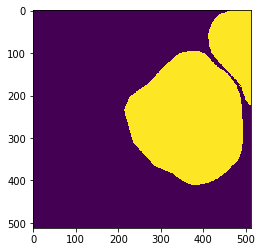

In [377]:
plt.imshow(PdMap)

In [378]:
metrics.accuracy_score(PdMap.flatten(),Pd_bin.flatten())

0.9678840637207031

In [383]:
np.save('Pdimg.npy',a)